# Conversión de clave Morse a texto
## usando Scipy

In [2]:
import IPython
IPython.display.Audio(filename='./wikipedia.wav')


In [3]:
texto = '??? ???? ????? ?????'

### https://code.google.com/archive/p/morse-to-text/

# [La clave Morse](https://en.wikipedia.org/wiki/Morse_code)

# Scipy
## el ecosistema de paquetes para matemáticas, ingeniería y ciencias

- IPython
- Numpy
- Matplotlib
- Scipy

## recursos
### 1 numpy
- array, zeros, ones
- argmax, append, sort
- matrix, multiply
- mean, std
- fft.rfft, fft.irfft

### 2 pyplot (matplotlib)
- figure
- subplot
- plot
- specgram

### 3 wavfile (scipy.io)
- read


In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile

# Pasos

1. Obtener muestras digitales del audio
- Filtrar una banda de frecuencias
- Convertir a niveles 1 y 0
- Convertir a puntos y rayas
- Convertir puntos y rayas a letras y espacios


# 5. Convertir puntos y rayas a letras y espacios

### el código Morse

In [6]:
renglones = '''\
0 -----
1 .----
2 ..---
3 ...--
4 ....-
5 .....
6 -....
7 --...
8 ---..
9 ----.
A .-
B -...
C -.-.
D -..
E .
F ..-.
G --.
H ....
I ..
J .---
K -.-
L .-..
M --
N -.
O ---
P .--.
Q --.-
R .-.
S ...
T -
U ..-
V ...-
W .--
X -..-
Y -.--
Z --..
= -...-
_ ..--.-
- -....-
, --..--
; -.-.-.
: ---...
! -.-.--
? ..--..
/ -..-.
. .-.-.-
' .----.
( -.--.
) -.--.-
@ .--.-.
$ ...-..-
& .-...
+ .-.-.
" .-..-.
'''

letra_a_codigo = dict(map(str.split, renglones.splitlines()))

print(letra_a_codigo)

{'U': '..-', 'P': '.--.', '?': '..--..', 'Z': '--..', 'I': '..', 'Y': '-.--', ':': '---...', 'G': '--.', 'C': '-.-.', 'Q': '--.-', '$': '...-..-', '"': '.-..-.', '-': '-....-', '8': '---..', '(': '-.--.', '6': '-....', '/': '-..-.', 'D': '-..', 'M': '--', 'B': '-...', 'N': '-.', '0': '-----', 'J': '.---', 'R': '.-.', 'O': '---', 'W': '.--', 'F': '..-.', "'": '.----.', '@': '.--.-.', ';': '-.-.-.', 'K': '-.-', '=': '-...-', ',': '--..--', 'L': '.-..', '3': '...--', '5': '.....', '4': '....-', 'X': '-..-', '&': '.-...', ')': '-.--.-', '!': '-.-.--', 'T': '-', 'H': '....', '+': '.-.-.', '7': '--...', '2': '..---', '1': '.----', '.': '.-.-.-', '9': '----.', '_': '..--.-', 'E': '.', 'S': '...', 'A': '.-', 'V': '...-'}


In [7]:
letra_a_codigo[' '] = '|'

### letras y espacios a puntos y rayas

In [8]:
texto = 'hola mundo'

for letra in texto:
    print(letra_a_codigo[letra.upper()], end='')
    print(' ', end='')

.... --- .-.. .- | -- ..- -. -.. --- 

### puntos y rayas a letras y espacios

In [9]:
codigo_a_letra = {c: l for l, c  in letra_a_codigo.items()}

print(codigo_a_letra)

{'..': 'I', '.-..': 'L', '.....': '5', '|': ' ', '-.--.': '(', '----.': '9', '-....-': '-', '--.': 'G', '.-.-.': '+', '.-...': '&', '..-.': 'F', '---...': ':', '--..--': ',', '....': 'H', '-.--.-': ')', '...--': '3', '.-..-.': '"', '--...': '7', '..--.-': '_', '...-..-': '$', '...-': 'V', '.----': '1', '-.': 'N', '...': 'S', '..---': '2', '---': 'O', '-..-.': '/', '-.-.-.': ';', '.--.': 'P', '--.-': 'Q', '.---': 'J', '--': 'M', '....-': '4', '.': 'E', '-...-': '=', '-..-': 'X', '-...': 'B', '-': 'T', '---..': '8', '.-.': 'R', '.-.-.-': '.', '-..': 'D', '-----': '0', '..--..': '?', '..-': 'U', '.--.-.': '@', '.-': 'A', '-.-': 'K', '-.-.': 'C', '-.--': 'Y', '-.-.--': '!', '.--': 'W', '.----.': "'", '--..': 'Z', '-....': '6'}


In [10]:
codigos = '.... --- .-.. .- | -- ..- -. -.. ---'

for codigo in codigos.split():
    print(codigo_a_letra[codigo], end='')

HOLA MUNDO

# 1. Obtener muestras digitales del audio

In [11]:
rate, samples = wavfile.read('wikipedia.wav')

In [12]:
msg = '{:,} muestras / {:,} muestras/segundo = {:2.4} segundos'
print(msg.format(len(samples), rate, len(samples)/rate))

2,416,640 muestras / 44,100 muestras/segundo = 54.8 segundos


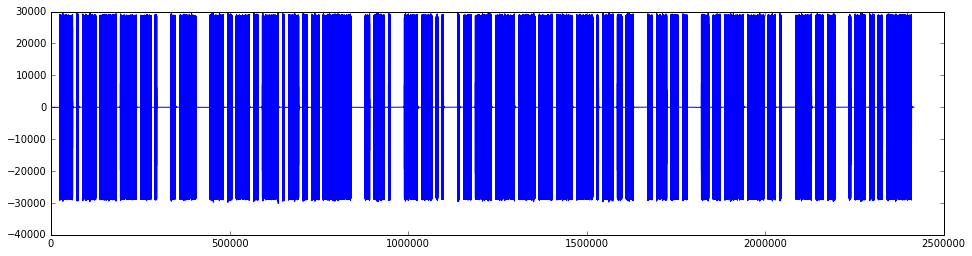

In [13]:
%matplotlib inline
plt.figure(figsize=(16,4))
plt.plot(samples)

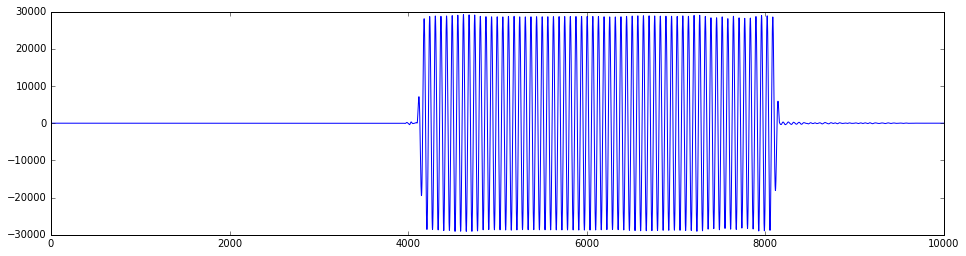

In [14]:
plt.figure(figsize=(16,4))
plt.plot(samples[20000:30000])


# 1. Filtrar una banda de frecuencias
1. Obtener transformada de Fourier de la señal
- Encontrar valor máximo del arreglo de la transformada
- Generar un arreglo de filtro
   - Valor 0 para frecuencias < 200 Hz
   - Valor 1 para máximo - banda/2 < f < máximo + banda/2
   - Valor 0 para f > máximo + banda/2
- Multiplicar transformada por el arreglo de filtro
- Aplicar transformada inversa de Fourier para obtener señal filtrada

In [15]:
transform = np.fft.rfft(samples)

msg = '{:,} elementos = {:,} muestras / 2 + 1'
print(msg.format(len(transform), len(samples)))

1,208,321 elementos = 2,416,640 muestras / 2 + 1


In [16]:
transform_real = abs(transform)

/usr/lib/python3/dist-packages/numpy/core/numeric.py:482: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


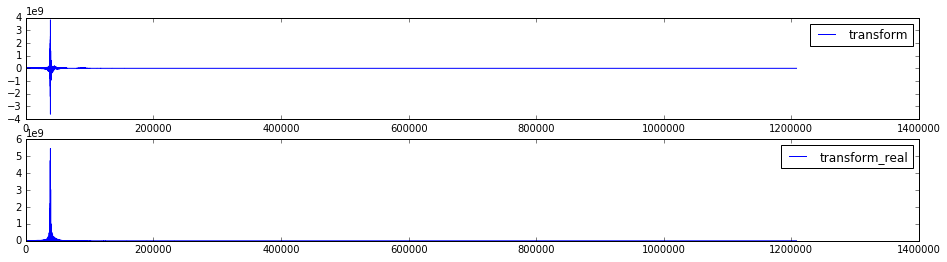

In [17]:
plt.figure(figsize=(16,4))
plt.subplot(211)
plt.plot(transform, label='transform')
plt.legend()
plt.subplot(212)
plt.plot(transform_real, label='transform_real')
plt.legend()

In [19]:
banda = 2000
hzignored = 200

indice_frec_max = hzignored + np.argmax(transform_real[hzignored:])
limite_inferior_banda = indice_frec_max - banda / 2 if indice_frec_max > banda / 2 else 0
print(limite_inferior_banda)

frecuencias_bajas = np.zeros(limite_inferior_banda)
filter_array = np.append(frecuencias_bajas, np.ones(banda))
frecuencas_altas= np.zeros(len(transform_real) - (limite_inferior_banda + banda))
filter_array = np.append(filter_array, frecuencas_altas)

filtered_array = np.multiply(transform, filter_array)

filtered_signal = np.array(np.fft.irfft(filtered_array)[:len(samples)], dtype="int16")

print(len(filter_array))

37414.0


/home/pp/.local/lib/python3.5/site-packages/ipykernel/__main__.py:8: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/pp/.local/lib/python3.5/site-packages/ipykernel/__main__.py:10: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


1208321


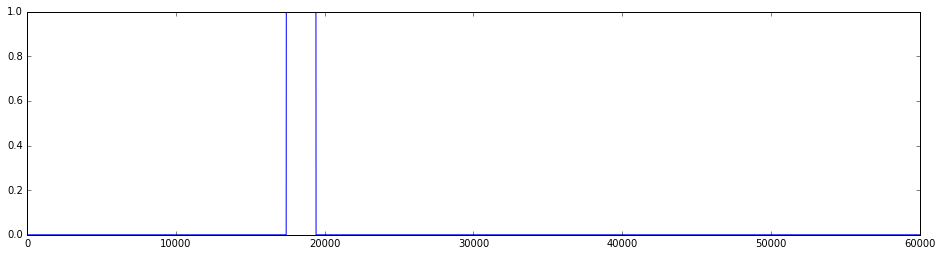

In [20]:
plt.figure(figsize=(16,4))
plt.plot(filter_array[20000:80000])

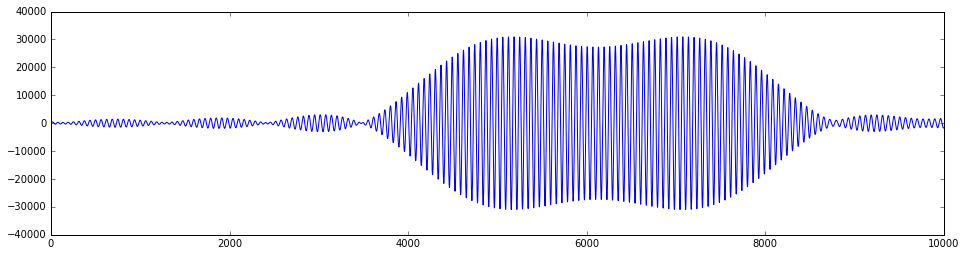

In [21]:
plt.figure(figsize=(16,4))
plt.plot(filtered_signal[20000:30000])


In [22]:
IPython.display.Audio(data=filtered_signal, rate=44100)

# 2. Convertir a niveles 1 y 0
   1. Obtener espectrograma
   - Sumar los valores de frecuencia de cada ventana para obtener valores positivos
   - Determinar un umbral
   - Convertir valores positivos a niveles 1 y 0 usando el umbral
   - Obtener duraciones de 1's y 0's

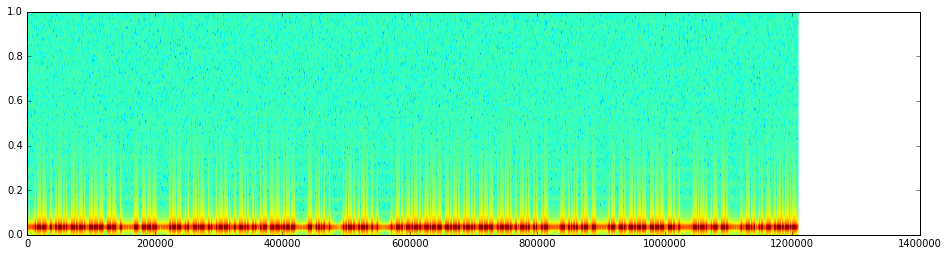

In [23]:
plt.figure(figsize=(16,4))
spectrogram = plt.specgram(filtered_signal)

In [24]:
matriz = spectrogram[0]

msg = '{} frecuencias {:,} ventanas = {:,} muestras / 256 muestras/ventana * 256/128 overlap -1'
print(msg.format(len(matriz), len(matriz[0]), len(filtered_signal)))

129 frecuencias 18,879 ventanas = 2,416,640 muestras / 256 muestras/ventana * 256/128 overlap -1


In [25]:
vector_unos = np.ones(len(matriz))
producto = np.matrix(vector_unos) * matriz
vector_suma = producto.transpose()
len(vector_suma)

18879

In [26]:
threshold = np.max(vector_suma / 2.0)
print(threshold)

32548036150.5


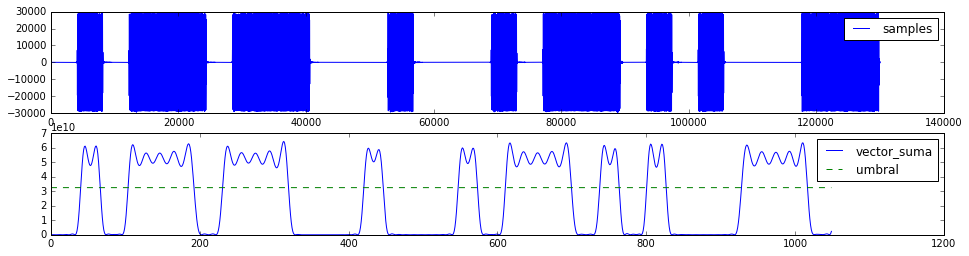

In [27]:
umbral = np.ones(1200-150) * threshold
plt.figure(figsize=(16,4))
plt.subplot(211)
plt.plot(samples[20000:150000], label='samples')
plt.legend()
plt.subplot(212)
plt.plot(vector_suma[150:1200], 'b-', label='vector_suma')
plt.plot(umbral, 'g--', label='umbral')
plt.legend()

### Convertir valores positivos a 1's y 0's

In [28]:
levels = np.zeros(len(vector_suma))
for i, valor in enumerate(vector_suma):
    if valor > threshold:
        levels[i] = 1

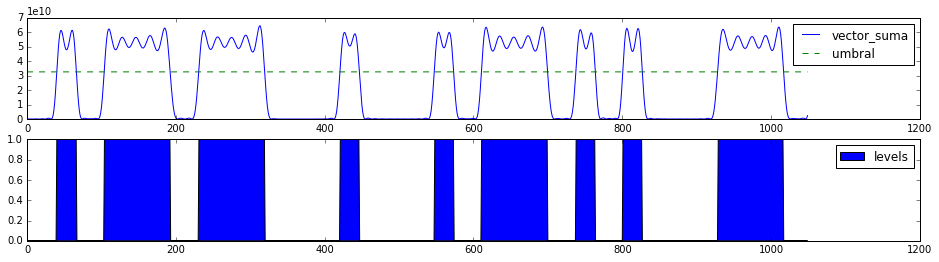

In [31]:
umbral = np.ones(1200-150) * threshold
plt.figure(figsize=(16,4))
plt.subplot(211)
plt.plot(vector_suma[150:1200], label='vector_suma')
plt.plot(umbral, 'g--', label='umbral')
plt.legend()
plt.subplot(212)
plt.fill(levels[150:1200], label='levels')
plt.legend()

### Obtener duraciones de 1's y 0's

In [32]:
lengths = []
last_level = 0
length = 0
for level in levels:
    if level == last_level:
        length += 1
    else:
        lengths.append(length)
        length = 0
        last_level = level

print(lengths)

[190, 26, 36, 88, 37, 88, 100, 25, 100, 25, 36, 88, 37, 25, 36, 25, 101, 87, 37, 25, 36, 88, 37, 25, 100, 88, 37, 88, 37, 87, 101, 88, 37, 87, 101, 25, 322, 87, 101, 88, 37, 87, 37, 88, 322, 25, 37, 87, 38, 87, 100, 26, 36, 25, 100, 88, 36, 26, 36, 88, 100, 25, 36, 25, 100, 25, 37, 87, 38, 88, 36, 25, 100, 25, 100, 88, 36, 26, 36, 25, 100, 25, 36, 25, 100, 25, 36, 88, 101, 88, 37, 87, 37, 25, 36, 26, 36, 88, 37, 88, 322, 88, 100, 25, 36, 26, 35, 26, 36, 25, 100, 25, 322, 25, 35, 26, 36, 88, 37, 25, 100, 25, 36, 88, 37, 25, 100, 25, 100, 25, 321, 25, 100, 88, 37, 25, 100, 88, 36, 26, 36, 88, 37, 25, 100, 88, 36, 25, 37, 88, 37, 87, 101, 88, 36, 25, 37, 88, 37, 25, 99, 25, 37, 88, 37, 25, 36, 25, 100, 88, 37, 87, 38, 87, 100, 26, 36, 88, 37, 88, 36, 25, 100, 25, 100, 88, 37, 25, 36, 25, 100, 25, 36, 25, 100, 25, 36, 89, 322, 88, 100, 25, 36, 25, 36, 26, 36, 25, 100, 25, 36, 88, 101, 88, 321, 25, 37, 88, 100, 88, 37, 25, 100, 88, 36, 25, 37, 88, 37, 87, 101, 88, 37, 87, 37, 88, 101, 88, 3

### descartar la primera duración si el nivel es un cero

In [33]:
if levels[0] == 0:
    print(lengths.pop(0))

190


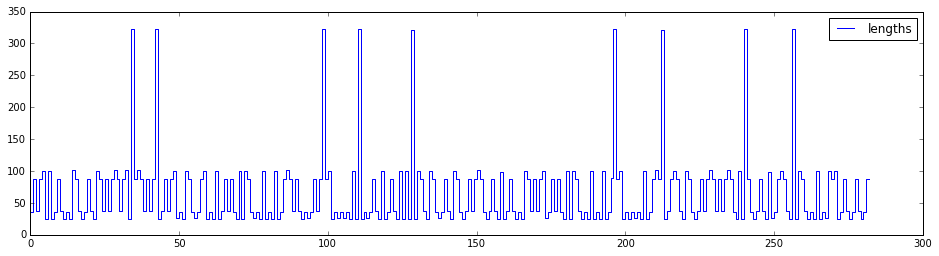

In [34]:
plt.figure(figsize=(16,4))
plt.plot(lengths, label='lengths', drawstyle='steps')
plt.legend()

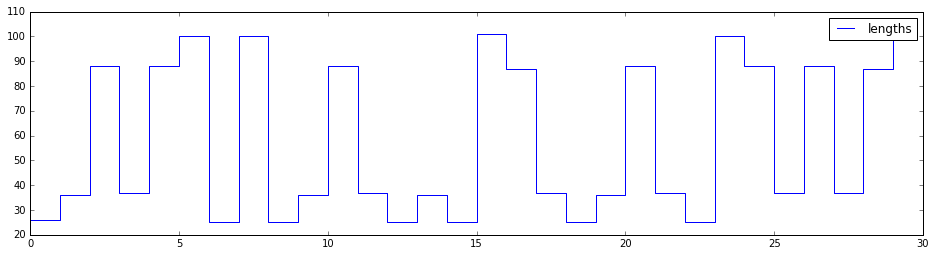

In [35]:
plt.figure(figsize=(16,4))
plt.plot(lengths[:30], label='lengths', drawstyle='steps-post')
plt.legend()

#Convertir a puntos y rayas
   - Separar las duraciones de 1's y 0's en cortas y largas
   - Calcular promedio y desviación estándar de cada grupo
   - Convertir dureciones de 1's a punto o raya
   - Convertir duraciones de 0's en 
     - espacio entre punto o raya
     - espacio entre letra
     - espacio entre palabra

In [47]:
ones_lengths = lengths[0::2]
zeros_lengths = lengths[1::2]

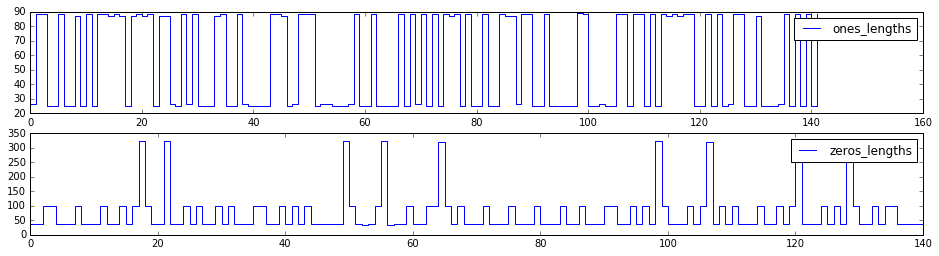

In [48]:
plt.figure(figsize=(16,4))
plt.subplot(211)
plt.plot(ones_lengths, label='ones_lengths', drawstyle='steps-post')
plt.legend()
plt.subplot(212)
plt.plot(zeros_lengths, label='zeros_lengths', drawstyle='steps-post')
plt.legend()

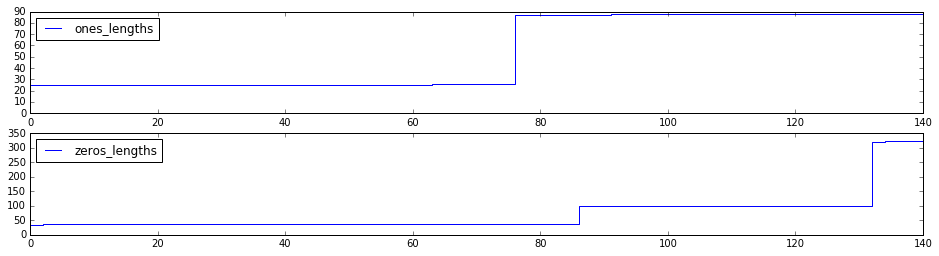

In [50]:
plt.figure(figsize=(16,4))
plt.subplot(211)
plt.axis([0, 140, 0, 90])
plt.plot(np.sort(ones_lengths), label='ones_lengths', drawstyle='steps-post')
plt.legend(loc='upper left')
plt.subplot(212)
plt.plot(np.sort(zeros_lengths), label='zeros_lengths', drawstyle='steps-post')
plt.legend(loc='upper left')

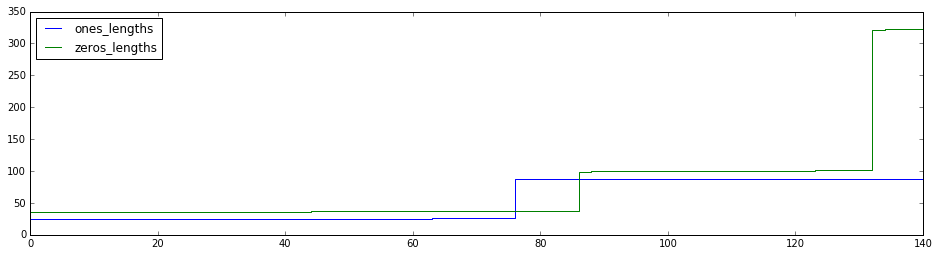

In [53]:
plt.figure(figsize=(16,4))
plt.axis([0, 140, 0, 350])
plt.plot(np.sort(ones_lengths), label='ones_lengths', drawstyle='steps-post')
plt.legend(loc='upper left')
plt.plot(np.sort(zeros_lengths), label='zeros_lengths', drawstyle='steps-post')
plt.legend(loc='upper left')

### El criterio es: duraciones largas son las que superan el doble de la duración más corta

In [54]:
def split_long_short(lengths):
    'Regresa lengths ordenado y partido en dos'

    sorted_lengths = np.sort(lengths)
    shortest_length = sorted_lengths[0]

    for i, length in enumerate(sorted_lengths):
        if length > 2 * shortest_length:
            shorts = sorted_lengths[:i-1]
            longs = sorted_lengths[i:]
            return (shorts, longs)
    return (lengths, [])

shorts, longs = split_long_short(ones_lengths)
ones_stats = (np.mean(shorts), np.std(shorts), np.mean(longs), np.std(longs))

shorts, longs = split_long_short(zeros_lengths)
zeros_stats = (np.mean(shorts), np.std(shorts), np.mean(longs), np.std(longs))

shorts, longs = split_long_short(longs)
zeros_stats2 = (np.mean(shorts), np.std(shorts), np.mean(longs), np.std(longs))

print(ones_stats)
print(zeros_stats)
print(zeros_stats2)

(25.16, 0.36660605559646725, 87.787878787878782, 0.44432964541258124)
(36.482352941176472, 0.58634991973539363, 136.41818181818181, 81.990618290163582)
(100.13333333333334, 0.45215533220835119, 321.77777777777777, 0.41573970964154905)


In [55]:
def select_symbol(stats, n, short_val, long_val, default='?'):
    d = 4
    shortmean, shortstd, longmean, longstd = stats
    if shortmean - d * shortstd < n < shortmean + d * shortstd:
        return short_val
    if longmean - d * longstd < n < longmean + d * longstd:
        return long_val
    return default



s = ""
for one_length, zero_length in zip(ones_lengths, zeros_lengths):
    s += select_symbol(ones_stats, one_length, '.', '-')
    sym = select_symbol(zeros_stats, zero_length, '', ' ')
    if sym == '':
        s += sym
    else:
        s += select_symbol(zeros_stats2, zero_length, ' ', ' | ', ' ')
s += select_symbol(ones_stats, lengths[-1], '.', '-')

s

'.-- . .-.. -.-. --- -- . | - --- | .-- .. -.- .. .--. . -.. .. .- --..-- | - .... . | ..-. .-. . . | . -. -.-. -.-- -.-. .-.. --- .--. . -.. .. .- | - .... .- - | .- -. -.-- --- -. . | -.-. .- -. | . -.. .. - .-.-.-'

In [56]:
text = ""
for code in s.split():
    char = codigo_a_letra.get(code, '!')
    text += char

text

'WELCOME TO WIKIPEDIA, THE FREE ENCYCLOPEDIA THAT ANYONE CAN EDIT.'